In [1]:
import os
import numpy as np
import pandas as pd
os.environ["NAMESPACE"]="research"
os.environ["PROFILE"]="local"
from agrobrain_util.runtime.evironment import RuntimeEnv
from agrobrain_util.infra.app_config import application_config as cfg

import shutil
import glob
from skimage import io
import matplotlib.pyplot as plt
import json
import random
import glob
import datetime
from tqdm import tqdm
from datetime import datetime

from PIL import Image


env = RuntimeEnv()
categories_dict = cfg['tags']['categories']

DATA_DIR = "data"

could not find stamp in environment variables
could not find stamp in environment variables
could not find KUBEFLOW_API_BASIC_AUTH_TOKEN in environment variables
could not find AI_RABBITMQ_CONNECTION_STRING in environment variables
could not find AI_MONGO_DB_CONNECTION_STRING in environment variables
could not find TARANIS_DB_CONNECTION_STRING in environment variables
could not find GLOBAL_DB_CONNECTION_STRING in environment variables
could not find AI_MONGO_DB_CONNECTION_STRING_NEW in environment variables


In [2]:
# INITIALIZE - READ WEEDS_IMAGES_DF, FILTERED_IMAGES_DF, CREATE CATEGORIES DICTIONARY
def get_wide_images_list(current_df):
    l  = []
    for i in tqdm(range(0, len(current_df['imageID']), 10)):
        # print(current_df['imageID'][i])
        wide_image_id = env.eti_api.get_matching_wide_images(list(current_df['imageID'][i:i+10]))
        # print(wide_image_id)
        l.append(wide_image_id)
    wide_images_list = [item for sublist in l for item in sublist]
    return wide_images_list

def create_cat_dict(cat_list):
    cat_dict_types = {}
    cat_dict_names = {}
    for l in cat_list:
        cat_dict_types[l['id']] = l['type']
        if 'name' in l:
            cat_dict_names[l['id']] = l['name']
        else:
            cat_dict_names[l['id']] = 'NoName'
    cat_dict_types[0] = None
    cat_dict_names[0] = None
    return cat_dict_types, cat_dict_names

# READ FILTERED DATAFRAME - ONLY THE IMAGES THAT CONTAINES WEEDS. ADDING WEEDS DATA LIKE TYPE IDS, NAME, COVARAGE
# # weeds_images_df = pd.read_csv("/mnt/disks/datasets/wide_images/weeds_images_df.csv")
weeds_images_df = pd.read_csv(os.path.join(DATA_DIR, "weeds_images_df_light.csv"))

weeds_images_df['weed_types_ids_list'] = weeds_images_df['weed_types_ids_list'].apply(eval)
weeds_images_df['uploadDate_time'] = weeds_images_df['uploadDate'].apply(datetime.fromtimestamp)
weeds_images_df['uploadDate_date'] = weeds_images_df['uploadDate_time'].apply(lambda x: x.to_pydatetime().date())
filtered_weeds_images_df = weeds_images_df[(weeds_images_df['cameraAngle'] > -95) & (weeds_images_df['cameraAngle'] < -85)]
images_df = filtered_weeds_images_df
weeds_images_df = 0
filtered_weeds_images_df = 0

# # FITER "ONE WEED TYPE" DATAFRAME AND ADD RELEVANT FEATURES

images_df['num_weed_types'] = images_df['weed_types_ids_list'].apply(len)
one_weed_type_df = images_df[images_df['num_weed_types']==1].reset_index(drop=True)
one_weed_type_df['weed_types_ids'] = one_weed_type_df['weed_types_ids_list'].apply(lambda x: x[0])
one_weed_type_df['weed_inferenceTagsCount'] = one_weed_type_df['weed_inferenceTagsCount'].apply(eval)
one_weed_type_df['weed_inferenceTagsCount'] = one_weed_type_df['weed_inferenceTagsCount'].apply(lambda x: x[0])
one_weed_type_df['weed_manualTagsCount'] = one_weed_type_df['num_weed_tags'] - one_weed_type_df['weed_inferenceTagsCount']
# one_weed_type_df = one_weed_type_df[one_weed_type_df['num_weed_tags'] > 1].reset_index(drop=True)
one_weed_type_df = one_weed_type_df[(one_weed_type_df['num_weed_tags'] > 1) & (one_weed_type_df['num_weed_tags'] <= 5)].reset_index(drop=True)

images_df = 0

# CREATE CATEGORIES DICTIONARY
categories_hierarchy = env.eti_api.get_categories_hierarchy()
cat_dict_types, cat_dict_names = create_cat_dict(categories_hierarchy[9]['subCategories'])

In [3]:
len(one_weed_type_df)

45533

In [19]:
# FILTER IMAGES BY NUMBER OF TAGS
unique_values, counts= np.unique(one_weed_type_df['num_weed_tags'], return_counts=True)
unique_values[:20], counts[:20]

(array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
        19, 20, 21]),
 array([3060, 1983, 1408, 1205,  973,  798,  667,  588,  565,  475,  512,
         450,  417,  378,  374,  323,  301,  310,  310,  282]))

In [16]:
n = sum(counts[:20])
n

75621

In [20]:
# one_weed_type_df = one_weed_type_df.sort_values(by='num_weed_tags', ascending=True)
# one_weed_type_df = one_weed_type_df[:n]

one_weed_type_df = one_weed_type_df.sort_values(by='weed_inferenceTagsCount', ascending=True)
df_for_resolution_lim_checkup = one_weed_type_df[:500]
# df_for_resolution_lim_checkup = one_weed_type_df[:500].reset_index(drop=True)
one_weed_type_df = one_weed_type_df.drop(df_for_resolution_lim_checkup.index)

one_weed_type_df = one_weed_type_df[one_weed_type_df['weed_inferenceTagsCount']==0].reset_index(drop=True)
one_weed_type_df = one_weed_type_df.sort_values(by='weed_manualTagsCount', ascending=True)
df_for_resolution_lim_checkup = pd.concat([df_for_resolution_lim_checkup, one_weed_type_df[:500].reset_index(drop=True)])


In [21]:
len(np.unique(df_for_resolution_lim_checkup['imageID']))

1000

In [8]:
df_for_resolution_lim_checkup = one_weed_type_df.sample(n=1000).reset_index(drop=True)

len(df_for_resolution_lim_checkup)

1000

In [23]:
df_for_resolution_lim_checkup.to_csv(os.path.join(DATA_DIR, "df_for_resolution_lim_checkup_100_samples_2023_06_12.csv"))
# df_for_resolution_lim_checkup = pd.read_csv(os.path.join(DATA_DIR, "df_for_resolution_lim_checkup_100_samples.csv"))

In [28]:
# # READ FILTERED DF, ADD SOME COLUMNS
# # top_weeds_df = pd.read_csv('/mnt/disks/datasets/wide_images/filtered_weeds_df.csv')
# top_weeds_df = pd.read_csv(os.path.join(DATA_DIR, "filtered_weeds_df.csv"))

# top_weeds_df['uploadDate_time'] = top_weeds_df['uploadDate'].apply(datetime.fromtimestamp)
# top_weeds_df['uploadDate_date'] = top_weeds_df['uploadDate_time'].apply(lambda x: x.to_pydatetime().date())
# top_weeds_df['weed_types_ids_list'] = top_weeds_df['weed_types_ids_list'].apply(eval)
# top_weeds_df['num_weed_types'] = top_weeds_df['weed_types_ids_list'].apply(len)

# top_weeds_df['weed_types_ids'] = top_weeds_df['weed_types_ids_list'].apply(lambda x: x[0])
# top_weeds_df['weed_inferenceTagsCount'] = top_weeds_df['weed_inferenceTagsCount'].apply(eval)
# top_weeds_df['weed_inferenceTagsCount'] = top_weeds_df['weed_inferenceTagsCount'].apply(lambda x: x[0])
# top_weeds_df['weed_manualTagsCount'] = top_weeds_df['num_weed_tags'] - top_weeds_df['weed_inferenceTagsCount']


In [ ]:
# SHOW ZOOM-WIDE COUPLE OF IMAGES FROM THE DATAFRAME

# df_to_show = df_for_resolution_lim_checkup[20:].reset_index(drop=True)
df_to_show = df_for_resolution_lim_checkup.sample(n=10).reset_index(drop=True)

for i in range(len(df_to_show)):
    example_image_id = df_to_show['imageID'][i]
    # SHOW IMAGES
    print(f"Zoom image id: {example_image_id}")
    image_data = df_to_show[df_to_show['imageID'] == example_image_id].reset_index(drop=True)

    # image_data = df_to_show[df_to_show['imageID'] == example_image_id]
    # matching_wide_image_id = int(image_data.at[0, 'wideImageID'])
    # print(f"Wide image id: {matching_wide_image_id}")
    image_num_tags = image_data.at[0, 'num_weed_tags']
    image_num_manual_tags = image_data.at[0, 'weed_manualTagsCount']
    image_num_inference_tags = image_data.at[0, 'weed_inferenceTagsCount']

    image_crop_name = image_data.at[0, 'cropName']
    upload_date = image_data.at[0, 'uploadDate_date']
    weed_types = image_data.at[0, 'weed_types_ids_list']
    # weed_types = eval(image_data.at[0, 'weed_types_ids_list'])
    weed_types = list(map(cat_dict_names.get, weed_types))


    im_path = env.download_image(int(example_image_id))
    image = io.imread(im_path)

    # wide_im_path = env.download_image(int(matching_wide_image_id))
    # wide_image = io.imread(wide_im_path)

    fig, axes = plt.subplots(nrows=1, ncols=1)
    axes.imshow(image, extent=[0, image.shape[1], 0, image.shape[0]])
    # axes[1].imshow(wide_image, extent=[0, wide_image.shape[1], 0, wide_image.shape[0]])


    axes.set_xticks([])
    axes.set_yticks([])
    fig.set_size_inches(20, 10)
    plt.suptitle(f"Crop Type: {image_crop_name}\nZoom Image ID: {example_image_id}\nuploadDate: {upload_date}\nNum Weed Tags: {image_num_tags}\nManual tags: {image_num_manual_tags}, Inference tags: {image_num_inference_tags}\nWeed types: {weed_types}")
    # plt.suptitle(f"Crop Type: {image_crop_name}\nZoom Image ID: {example_image_id}, Wide Image ID: {matching_wide_image_id}\nuploadDate: {upload_date}\nNum Weed Tags: {image_num_tags}\nManual tags: {image_num_manual_tags}, Inference tags: {image_num_inference_tags}\nWeed types: {weed_types}")

    plt.tight_layout()
    plt.show()


In [ ]:
interesting_zoom_images_list = [5225338, 10118954, 6284958, 6907615, 6941456]

In [20]:
blurred_image = skimage.measure.block_reduce(image, (2,2,1), np.mean).astype(np.uint8)

Zoom image id: 6500648


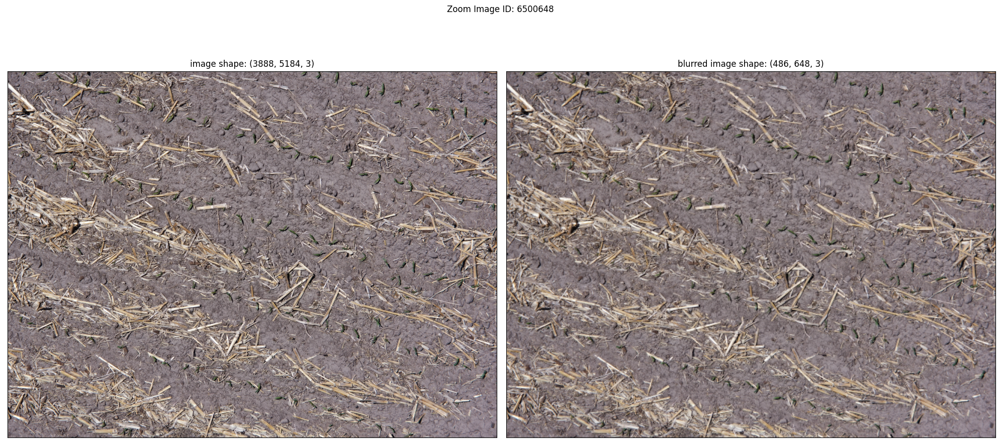

In [33]:
# BLUR AN IMAGE - GAUSSIAN / MAX POOLING / MEAN POOLING

from skimage.filters import gaussian
import skimage.measure

# example_image_id = 5225338
# example_image_id = 10118762
# example_image_id = 6941456
example_image_id = 6500648



print(f"Zoom image id: {example_image_id}")


im_path = env.download_image(int(example_image_id))

image = io.imread(im_path)
# blurred_image = gaussian(image, sigma=2, multichannel=True)
# blurred_image = skimage.measure.block_reduce(image, (2,2,1), np.max)
blurred_image = skimage.measure.block_reduce(image, (8,8,1), np.mean).astype(np.uint8)


fig, axes = plt.subplots(nrows=1, ncols=2)
axes[0].imshow(image, extent=[0, image.shape[1], 0, image.shape[0]])
axes[0].title.set_text(f'image shape: {image.shape}')
axes[1].imshow(blurred_image, extent=[0, image.shape[1], 0, image.shape[0]])
axes[1].title.set_text(f'blurred image shape: {blurred_image.shape}')


for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

fig.set_size_inches(20, 10)
plt.suptitle(f"Zoom Image ID: {example_image_id}")
plt.tight_layout()
plt.show()

Zoom image id: 6500648


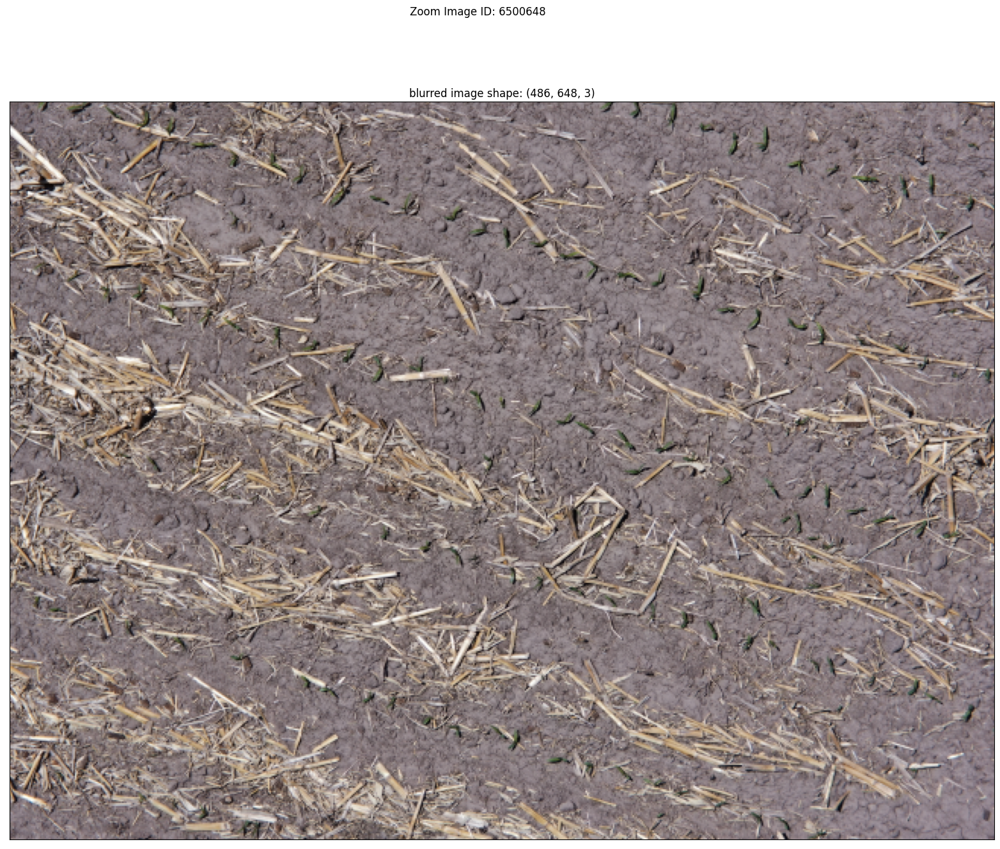

In [37]:
# DISPLAY ONE IMAGE - REGULAR OR BLURRED

from skimage.filters import gaussian
import skimage.measure

# example_image_id = 5225338
# example_image_id = 10118762
# example_image_id = 6941456
example_image_id = 6500648



print(f"Zoom image id: {example_image_id}")


im_path = env.download_image(int(example_image_id))

image = io.imread(im_path)

blurred_image = skimage.measure.block_reduce(image, (8,8,1), np.mean).astype(np.uint8)


fig, ax = plt.subplots(nrows=1, ncols=1)
ax.imshow(blurred_image, extent=[0, image.shape[1], 0, image.shape[0]])
ax.title.set_text(f'blurred image shape: {blurred_image.shape}')

ax.set_xticks([])
ax.set_yticks([])

fig.set_size_inches(30, 15)
plt.suptitle(f"Zoom Image ID: {example_image_id}")
# plt.tight_layout()
plt.show()

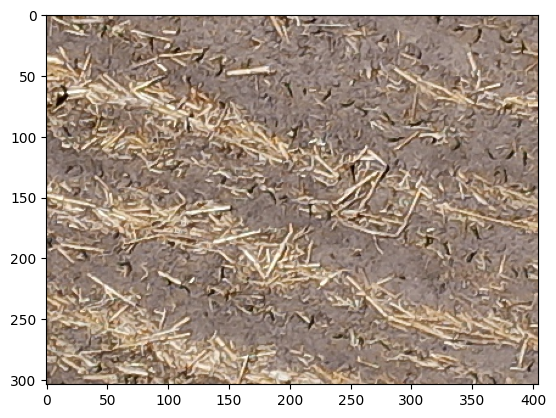

In [61]:
example_image_id = 6500648

im_path = env.download_image(int(example_image_id))

image = io.imread(im_path)
im_id = env.eti_api.get_matching_wide_images([example_image_id])
im_path = env.download_image(int(im_id[0]))
im = io.imread(im_path)

im_width = im.shape[0]
im_height = im.shape[1]

crop_width = im_width // 10
crop_height = im_height // 10

left = (im_width - crop_width) // 2
top = (im_height - crop_height) // 2
right = left + crop_width
bottom = top + crop_height

cropped_image = im[left:right, top:bottom]
plt.imshow(cropped_image)


Zoom image id: 6500648


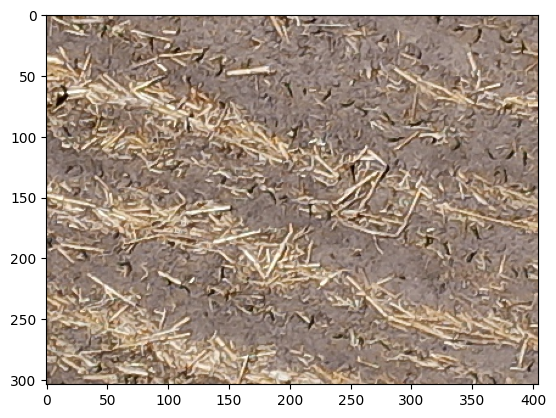

In [62]:
# CROP WIDE IMAGE IN THE MIDDLE

def crop_image(im, frac = 10):
    im_path = env.download_image(int(example_image_id))

    image = io.imread(im_path)
    im_id = env.eti_api.get_matching_wide_images([example_image_id])
    im_path = env.download_image(int(im_id[0]))
    im = io.imread(im_path)

    im_width = im.shape[0]
    im_height = im.shape[1]

    crop_width = im_width // 10
    crop_height = im_height // 10

    left = (im_width - crop_width) // 2
    top = (im_height - crop_height) // 2
    right = left + crop_width
    bottom = top + crop_height

    cropped_image = im[left:right, top:bottom]
    plt.imshow(cropped_image)
    return cropped_image

example_image_id = 6500648
print(f"Zoom image id: {example_image_id}")
cropped_image = crop_image(example_image_id)
plt.imshow(cropped_image)

Zoom image id: 8727696


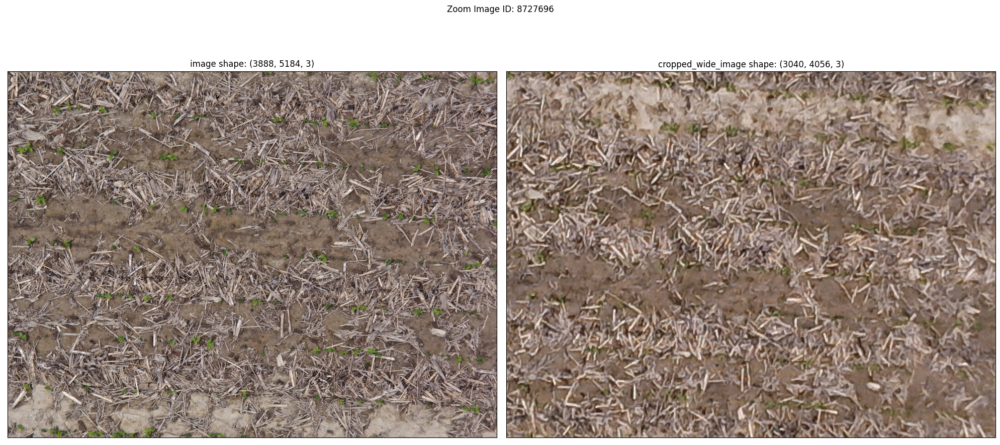

In [7]:
# DISPLAY ONE COUPLE - ZOOM AND WIDE IMAGES

from skimage.filters import gaussian
import skimage.measure

def crop_image(im, n = 8):
    # x_shift = 0
    # y_shift = 0

    x_shift = -30
    y_shift = 30

    im_width = im.shape[0]
    im_height = im.shape[1]

    crop_width = im_width // n
    crop_height = im_height // n

    left = (im_width - crop_width) // 2 + x_shift
    top = (im_height - crop_height) // 2 + y_shift
    right = left + crop_width + x_shift
    bottom = top + crop_height + y_shift

    cropped_image = im[left:right, top:bottom]
    # plt.imshow(cropped_image)
    return cropped_image

# example_image_id = 5225338
# example_image_id = 10118762
# example_image_id = 6941456
# example_image_id = 6500648
# example_image_id = 7751232
# example_image_id = 8827645
# example_image_id = 8432396
# example_image_id = 7850979



print(f"Zoom image id: {example_image_id}")


im_path = env.download_image(int(example_image_id))

image = io.imread(im_path)
wide_image_id = env.eti_api.get_matching_wide_images([example_image_id])
wide_im_path = env.download_image(int(wide_image_id[0]))
wide_image = io.imread(wide_im_path)
cropped_wide_image = crop_image(wide_image)
# blurred_image = gaussian(image, sigma=2, multichannel=True)
# blurred_image = skimage.measure.block_reduce(image, (2,2,1), np.max)
blurred_image = skimage.measure.block_reduce(image, (8,8,1), np.mean).astype(np.uint8)


fig, axes = plt.subplots(nrows=1, ncols=2)
axes[0].imshow(image, extent=[0, image.shape[1], 0, image.shape[0]])
axes[0].title.set_text(f'image shape: {image.shape}')
axes[1].imshow(cropped_wide_image, extent=[0, image.shape[1], 0, image.shape[0]])
axes[1].title.set_text(f'cropped_wide_image shape: {wide_image.shape}')


for ax in axes:
    ax.set_xticks([])
    ax.set_yticks([])

fig.set_size_inches(20, 10)
plt.suptitle(f"Zoom Image ID: {example_image_id}")
plt.tight_layout()
plt.show()

In [2]:
import dtlpy as dl
dl.login()

[2023-06-13 04:57:27][ERR][dtlpy:v1.78.17][services.logins:192] Login failed: no tokens obtained


False

In [46]:
# PREPARE IMAGES TO DATALOOP - 

# DOWNLOAD IMAGES
# env.image_downloader.parallel_download(df_to_dataloop['imageID'], destination_dir="images")



# MOVE TO FOLDER
import shutil

df_to_dataloop_path = os.path.join(DATA_DIR, "df_for_resolution_lim_checkup_100_samples_2023_06_12.csv")
df_to_dataloop = pd.read_csv(df_to_dataloop_path)

# MAKE SURE ALL THE IMAGES IN FINAL_DF EXISTS IN LOCAL FOLDER
existing_images_list = glob.glob(os.path.join("images", "*.jpg"))
check_list = []
for im_id in tqdm(df_to_dataloop['imageID']):
    if os.path.exists(os.path.join("images", f"{im_id}.jpg")):
        check_list.append(True)
    # else:
    #     im_path = env.download_image(int(im_id))

print(np.count_nonzero(check_list))


# MOVE CHOSEN IMAGES TO A FOLDER
source_folder = "images"
destination_folder = "images_to_dataloop_resolution_limitation_task"


if not os.path.exists(destination_folder):
    print("not")
    # os.makedirs(destination_folder)

# # Move the file
# for im_id in df_to_dataloop['imageID']:
#     source_path = os.path.join(source_folder, f"{int(im_id)}.jpg")
#     image_destination_path = os.path.join(destination_folder, f"{int(im_id)}.jpg")
#     if not os.path.exists(image_destination_path):
#         print(f"copying image {int(im_id)}.jpg")
#         shutil.copy2(source_path, destination_folder)

100%|██████████| 1000/1000 [00:00<00:00, 149114.90it/s]

1000
